reference - [Music Genre Classification with Python](https://towardsdatascience.com/music-genre-classification-with-python-c714d032f0d8)

reference git repo - [https://github.com/parulnith/Data-Science-Articles/tree/main/Music-Genre-Classification-with-Python-master](https://github.com/parulnith/Data-Science-Articles/tree/main/Music-Genre-Classification-with-Python-master)

# Audio Processing with Python

In [1]:
import librosa
import matplotlib.pyplot as plt
import librosa.display
import numpy as np
import soundfile as sf
import sklearn
%matplotlib inline

## Loading an audio file

In [2]:
audio_path = 'T08-violin.wav'
x , sr = librosa.load(audio_path)
print(type(x), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [3]:
print(x.shape, sr)

(396688,) 22050


In [4]:
librosa.load(audio_path, sr=44100)

(array([-0.0022583 , -0.00314331, -0.003479  , ...,  0.00091553,
         0.00091553,  0.00091553], dtype=float32),
 44100)

## Playing Audio

In [5]:
import IPython.display as ipd
ipd.Audio(audio_path)

## Visualizing Audio

### Waveform

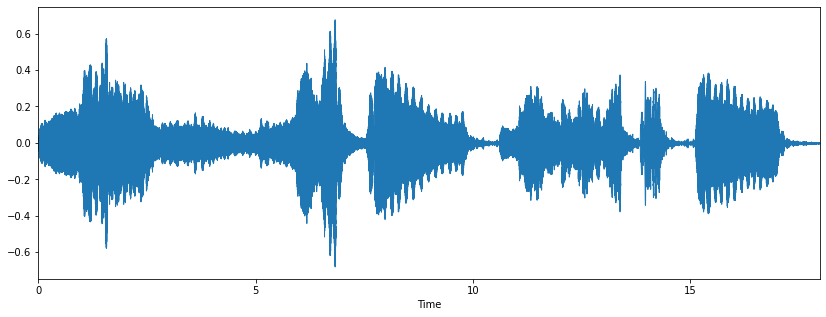

In [6]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

### Spectrogram

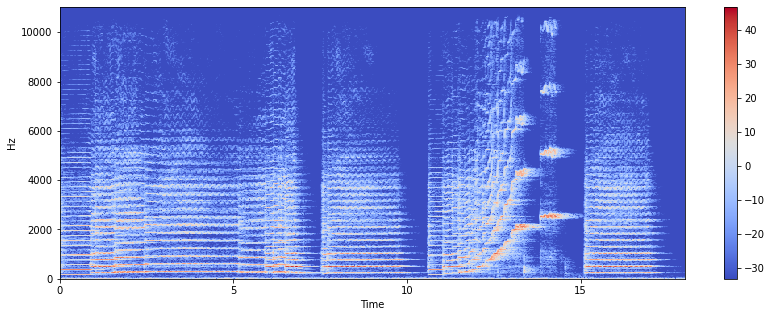

In [7]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

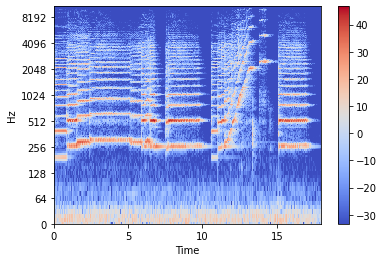

In [8]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

## Creating an audio signal

In [9]:
sr = 22050 # sample rate
T = 5.0    # seconds
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
x = 0.5*np.sin(2*np.pi*220*t)# pure sine wave at 220 Hz

In [10]:
ipd.Audio(x, rate=sr) # load a NumPy array

## Writing Audio

In [11]:
sf.write('tone_220.wav', x, sr)

# Feature extraction

## Zero-Crossing Rate
The zero-crossing rate is the rate of sign-changes along with a signal, i.e., the rate at which the signal changes from positive to negative or back. This feature has been used heavily in both speech recognition and music information retrieval. It usually has higher values for highly percussive sounds like those in metal and rock.

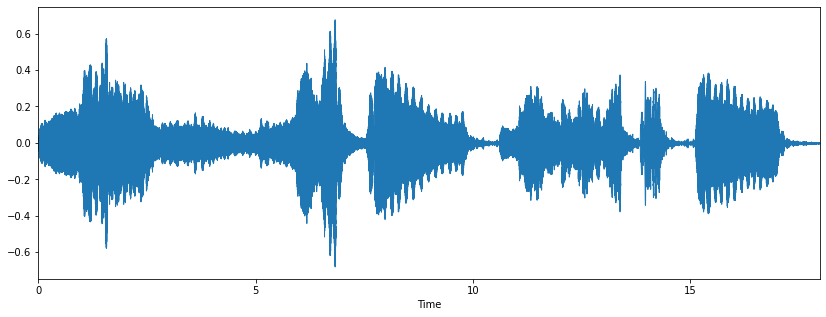

In [12]:
# Load the signal
x, sr = librosa.load('T08-violin.wav')
#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

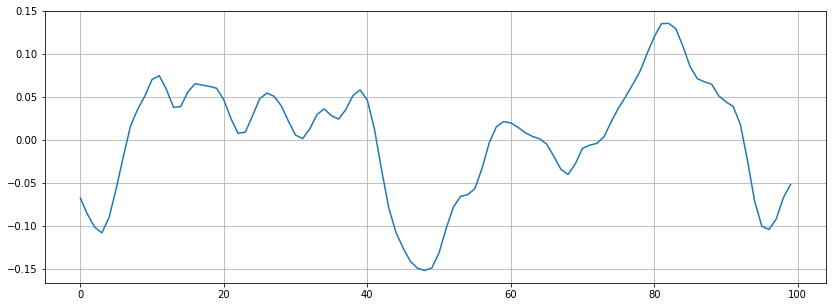

In [13]:
# Zooming in
n0 = 9000
n1 = 9100
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])
plt.grid()

In [14]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

6


## Spectral Centroid
It indicates where the ” center of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. Consider two songs, one from a blues genre and the other belonging to metal. Now, as compared to the blues genre song, which is the same throughout its length, the metal song has more frequencies towards the end. So spectral centroid for blues song will lie somewhere near the middle of its spectrum while that for a metal song would be towards its end.

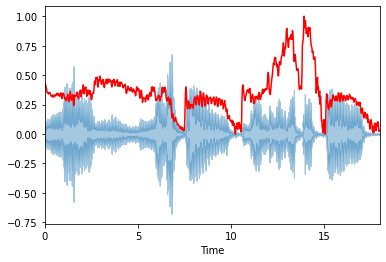

In [15]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape
(775,)
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

## Spectral Rolloff
It is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g., 85%, lies.

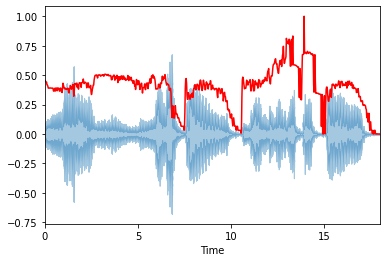

In [16]:
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

## Mel-Frequency Cepstral Coefficients
The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) that concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.

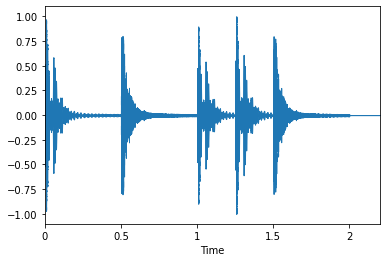

In [24]:
x, fs = librosa.load('simple_loop.wav')
librosa.display.waveplot(x, sr=sr)

(20, 95)


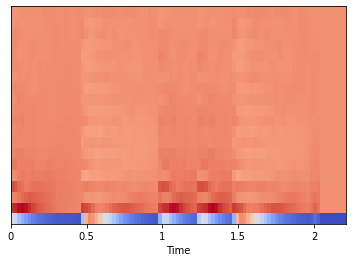

In [25]:
mfccs = librosa.feature.mfcc(x, sr=fs)
print(mfccs.shape)

#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

In [26]:
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))

[ 1.25483464e-08  1.25483464e-08 -7.52900764e-09  1.00386774e-08
 -6.27417340e-10  5.01933872e-09  2.03910631e-08  1.88225191e-09
 -7.76428966e-09  1.12935119e-08  0.00000000e+00 -1.25483468e-09
 -2.50966936e-09  6.27417318e-09  4.70562966e-09  1.88225191e-09
 -9.41125933e-09  8.78384210e-09  8.15642487e-09  7.52900764e-09]
[1.         1.0000002  1.0000001  1.0000004  1.         0.9999995
 0.9999998  0.99999976 1.0000001  0.99999976 1.0000004  1.
 1.0000004  1.0000001  0.9999997  0.99999994 1.0000004  1.
 1.         1.0000006 ]


C:\Users\shiva\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
C:\Users\shiva\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


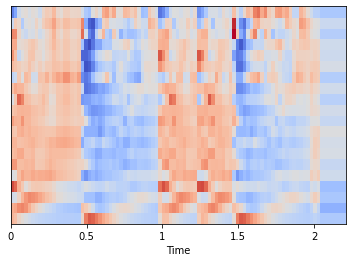

In [27]:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

## Chroma Frequencies
Chroma features are an interesting and powerful representation for music audio in which the entire spectrum is projected onto 12 bins representing the 12 distinct semitones (or chroma) of the musical octave.

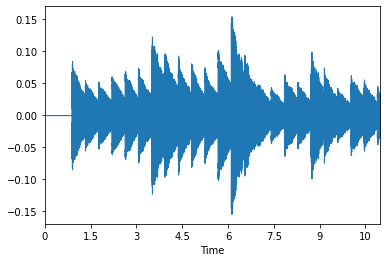

In [38]:
# Loadign the file
x, sr = librosa.load('simple_piano.wav')
librosa.display.waveplot(x, sr=sr)

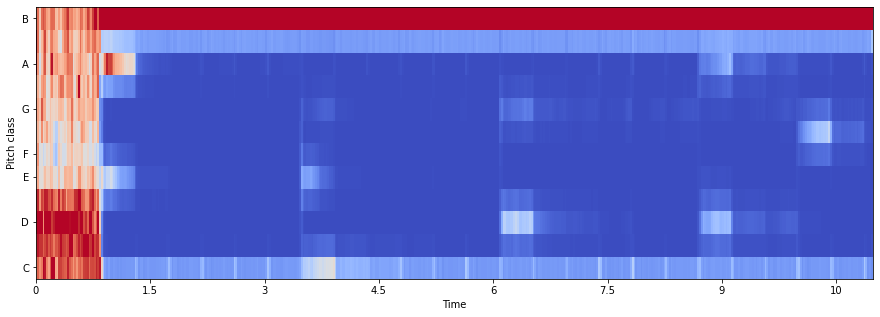

In [39]:
hop_length = 512
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')